Author: Omkar Bare

Aim: To identify the breed of the dog present in an given image

In [ ]:
# unzip the folder
!unzip "drive/My Drive/dog-vision/dog-breed-identification.zip" -d "drive/My Drive/dog-vision/"

Streaming output truncated to the last 5000 lines.
  inflating: drive/My Drive/dog-vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/My Drive/dog-vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/My Drive/dog-vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/My Drive/dog-vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/My Drive/dog-vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/My Drive/dog-vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/My Drive/dog-vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/My Drive/dog-vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/My Drive/dog-vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/My Drive/dog-vision/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: drive/My Drive/dog-vision/train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: drive/My Dri

In [ ]:
# Import tensorflow & tensorflow_hub
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available !")

TF version: 2.6.0
TF Hub version: 0.12.0
GPU available


In [ ]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/My Drive/dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     1dc5d9db984d35752841d81862184ba3  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


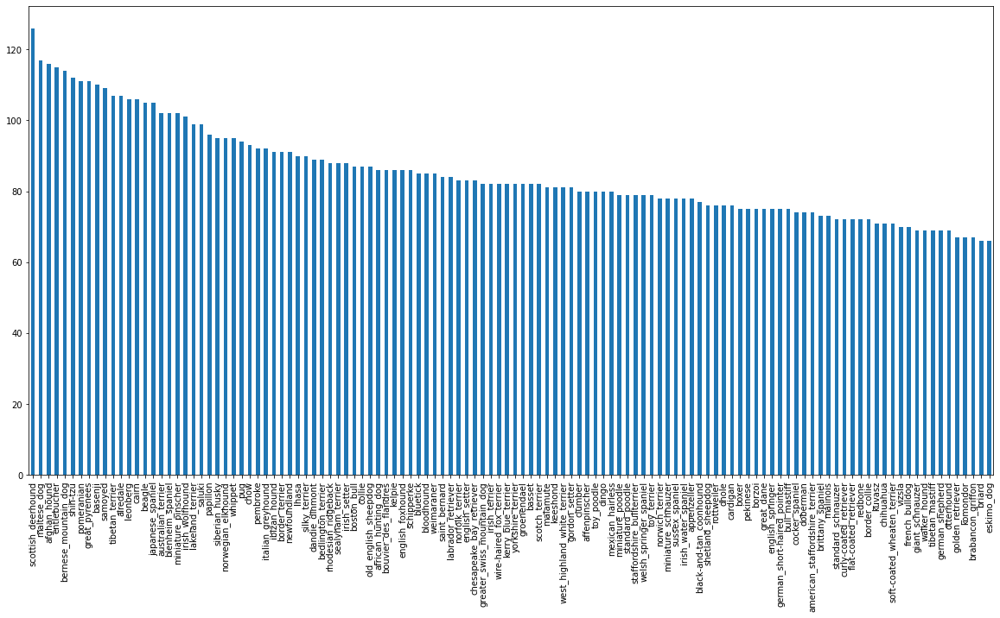

In [ ]:
# no. of count of each breed
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

In [ ]:
from IPython.display import Image

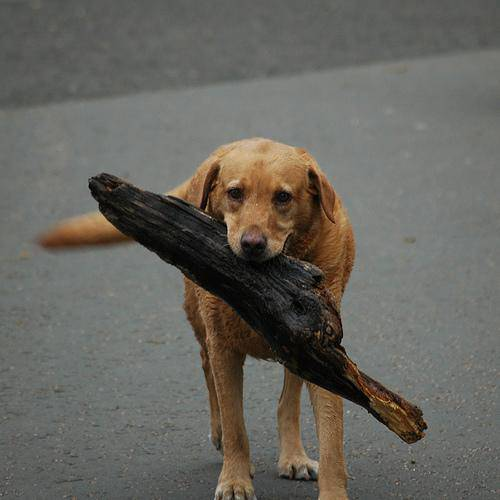

In [ ]:
# View an image
Image("drive/My Drive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

## Getting images and their labels

list of all our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image id's
filenames = ["drive/My Drive/dog-vision/train/" + fname for fname in labels_csv['id'] + '.jpg']

In [ ]:
filenames[:5]

['drive/My Drive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

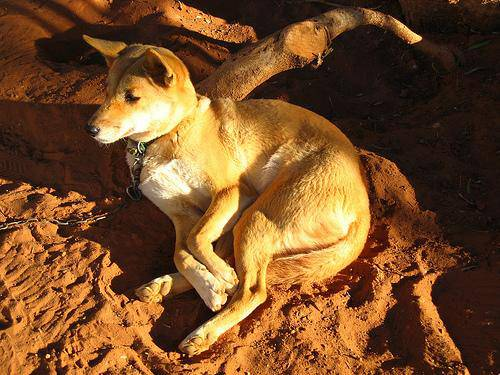

In [ ]:
Image(filenames[1])

In [ ]:
# Check whether number of filenames mathches number of actual image files
import os
if len(os.listdir("drive/My Drive/dog-vision/train/")) == len(filenames):
  print('length of files matches.')
else:
  print('length of files not matched!')  

length of files matches.


# Turn labels into numbers!

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy() # labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Check number of labels matches number of file names
if len(labels) == len(filenames):
  print('Number of label\'s matched with filenames')
else:
  print('Not matched !')  

Number of label's matched with filenames


In [ ]:
unique_breeds = np.unique(labels)

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into array of boolean's
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[2]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup data and label(X/y)
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimentation
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# split data into train and validation sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:5]

(['drive/My Drive/dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/dog-vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/dog-vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/dog-vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

# Preprocessing Images: turn images into Tensors
To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`


In [ ]:
# Conert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
image.max(), image.min() 

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE = 224

# Function for preprocessing images
def process_image(image_path, img_size = [IMG_SIZE, IMG_SIZE]):
  """
  Takes image path and turns the image into tensors
  """
  # Read an image
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Normalize the colour channel values (from 0-255 to 0-1)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize image to our desired values (height/width)
  image = tf.image.resize(image, size = img_size)   

  return image  

In [ ]:
t = tf.io.read_file(filenames[0])

In [ ]:
t

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01w\x01\xf4\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
t = tf.image.decode_jpeg(t, channels=3)

In [ ]:
t

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[107,  45,   0],
        [151,  91,  41],
        [177, 119,  69],
        ...,
        [175, 143,  68],
        [189, 157,  82],
        [213, 181, 106]],

       [[150,  92,  46],
        [179, 121,  75],
        [164, 110,  63],
        ...,
        [167, 136,  56],
        [171, 140,  60],
        [187, 156,  76]],

       [[150,  97,  55],
        [187, 136,  93],
        [161, 112,  69],
        ...,
        [199, 168,  78],
        [193, 162,  72],
        [200, 169,  79]],

       ...,

       [[188, 121,  66],
        [185, 118,  63],
        [182, 117,  63],
        ...,
        [213, 160, 106],
        [211, 158, 104],
        [208, 155, 101]],

       [[185, 118,  63],
        [183, 116,  61],
        [182, 117,  63],
        ...,
        [196, 144,  86],
        [199, 147,  90],
        [199, 147,  89]],

       [[181, 114,  59],
        [181, 114,  59],
        [181, 116,  62],
        ...,
        [184, 132,  7

In [ ]:
t = tf.image.convert_image_dtype(t, tf.float32)
t

<tf.Tensor: shape=(375, 500, 3), dtype=float32, numpy=
array([[[0.41960788, 0.1764706 , 0.        ],
        [0.5921569 , 0.35686275, 0.16078432],
        [0.69411767, 0.4666667 , 0.27058825],
        ...,
        [0.6862745 , 0.56078434, 0.26666668],
        [0.7411765 , 0.6156863 , 0.32156864],
        [0.8352942 , 0.70980394, 0.4156863 ]],

       [[0.5882353 , 0.36078432, 0.18039216],
        [0.7019608 , 0.47450984, 0.29411766],
        [0.6431373 , 0.43137258, 0.24705884],
        ...,
        [0.654902  , 0.53333336, 0.21960786],
        [0.67058825, 0.54901963, 0.23529413],
        [0.73333335, 0.6117647 , 0.29803923]],

       [[0.5882353 , 0.3803922 , 0.21568629],
        [0.73333335, 0.53333336, 0.3647059 ],
        [0.6313726 , 0.43921572, 0.27058825],
        ...,
        [0.7803922 , 0.65882355, 0.30588236],
        [0.7568628 , 0.63529414, 0.28235295],
        [0.7843138 , 0.6627451 , 0.30980393]],

       ...,

       [[0.7372549 , 0.47450984, 0.25882354],
        [0.72

In [ ]:
t = tf.image.resize(t, size=[200,100])
t

<tf.Tensor: shape=(200, 100, 3), dtype=float32, numpy=
array([[[0.6718137 , 0.45122552, 0.26029414],
        [0.77671576, 0.6215687 , 0.38357845],
        [0.6455883 , 0.47475493, 0.19534315],
        ...,
        [0.8816177 , 0.7958334 , 0.3387255 ],
        [0.77107847, 0.660049  , 0.31617647],
        [0.672549  , 0.54877454, 0.24607845]],

       [[0.6117647 , 0.42573532, 0.26200983],
        [0.82794124, 0.6916667 , 0.49387258],
        [0.55441177, 0.39754903, 0.16666667],
        ...,
        [0.85367656, 0.74436283, 0.31151962],
        [0.89019614, 0.7571079 , 0.44558826],
        [0.79754907, 0.67352945, 0.3120098 ]],

       [[0.47156864, 0.31617647, 0.17426471],
        [0.9276961 , 0.80147064, 0.6406863 ],
        [0.4654412 , 0.31029412, 0.14534314],
        ...,
        [0.9215687 , 0.7696079 , 0.3492647 ],
        [0.72352946, 0.57303923, 0.29534316],
        [0.83627456, 0.70612746, 0.29215688]],

       ...,

       [[0.7137255 , 0.45882356, 0.24705884],
        [0.73

In [ ]:
process_image(filenames[0], [200,100])

<tf.Tensor: shape=(200, 100, 3), dtype=float32, numpy=
array([[[0.6718137 , 0.45122552, 0.26029414],
        [0.77671576, 0.6215687 , 0.38357845],
        [0.6455883 , 0.47475493, 0.19534315],
        ...,
        [0.8816177 , 0.7958334 , 0.3387255 ],
        [0.77107847, 0.660049  , 0.31617647],
        [0.672549  , 0.54877454, 0.24607845]],

       [[0.6117647 , 0.42573532, 0.26200983],
        [0.82794124, 0.6916667 , 0.49387258],
        [0.55441177, 0.39754903, 0.16666667],
        ...,
        [0.85367656, 0.74436283, 0.31151962],
        [0.89019614, 0.7571079 , 0.44558826],
        [0.79754907, 0.67352945, 0.3120098 ]],

       [[0.47156864, 0.31617647, 0.17426471],
        [0.9276961 , 0.80147064, 0.6406863 ],
        [0.4654412 , 0.31029412, 0.14534314],
        ...,
        [0.9215687 , 0.7696079 , 0.3492647 ],
        [0.72352946, 0.57303923, 0.29534316],
        [0.83627456, 0.70612746, 0.29215688]],

       ...,

       [[0.7137255 , 0.45882356, 0.24705884],
        [0.73

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: 
`(image, label)`.

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Define batch size
BATCH_SIZE = 32

# Create function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image(X) and label(y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accept's test data(data with no labels) as input.
  """
  # If the data is test dataset(no labels)
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths , Convert it to tensors
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is validation datset, we don't need to shuffle it
  elif valid_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y)))  # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch                                           

  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffle pathnames and labels before mapping process_image function
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples and process_image
    data = data.map(get_image_label)
    # Turn the data to batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch  

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating test data batches...


In [ ]:
# Check different attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

## Visualize Data Batches!

In [ ]:
import matplotlib.pyplot as plt

# function for viewing imgaes in data batch
def show_25_images(images, labels):
  """
  Display a plot of 20 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 images
  for i in range(25):
    # Create subplots (5-rows, 5-columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an images
    plt.imshow(images[i])
    # Add image title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

In [ ]:
len(train_images), len(train_labels)

(32, 32)

In [ ]:
train_images, train_labels

(array([[[[0.36764377, 0.39509478, 0.43431047],
          [0.36354113, 0.38723686, 0.4339631 ],
          [0.37741536, 0.40094477, 0.4480036 ],
          ...,
          [0.28807318, 0.335132  , 0.38219082],
          [0.30033377, 0.34739262, 0.39445144],
          [0.28327942, 0.33033827, 0.3773971 ]],
 
         [[0.35903418, 0.3825636 , 0.4296224 ],
          [0.39209118, 0.4156206 , 0.46267942],
          [0.38839617, 0.41192558, 0.4589844 ],
          ...,
          [0.30497584, 0.35203466, 0.3990935 ],
          [0.30664384, 0.35370266, 0.40076151],
          [0.30772942, 0.35478824, 0.4018471 ]],
 
         [[0.39619592, 0.41972533, 0.46678415],
          [0.3711609 , 0.39469033, 0.44174916],
          [0.34829062, 0.37182006, 0.41887888],
          ...,
          [0.31213713, 0.35919595, 0.40688506],
          [0.32050055, 0.3675594 , 0.41524848],
          [0.3302519 , 0.37731075, 0.42499983]],
 
         ...,
 
         [[0.62222064, 0.6418285 , 0.6535932 ],
          [0.61068

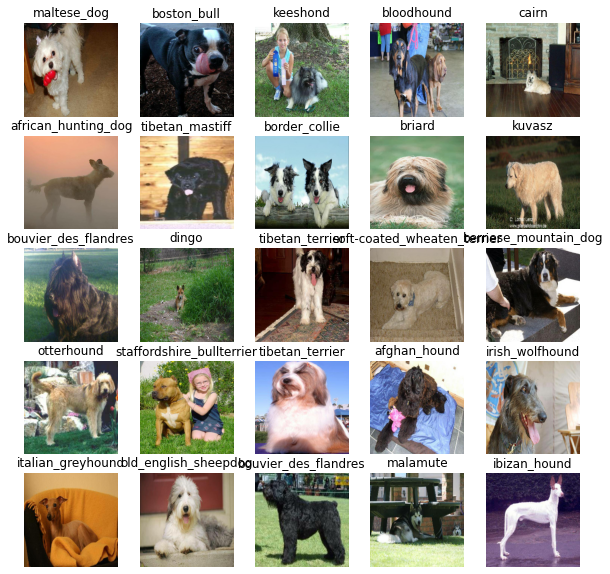

In [ ]:
# Visualize training data
train_images, train_labels = next(train_data.as_numpy_iterator()) #covert data batch to an iterator
show_25_images(train_images, train_labels)

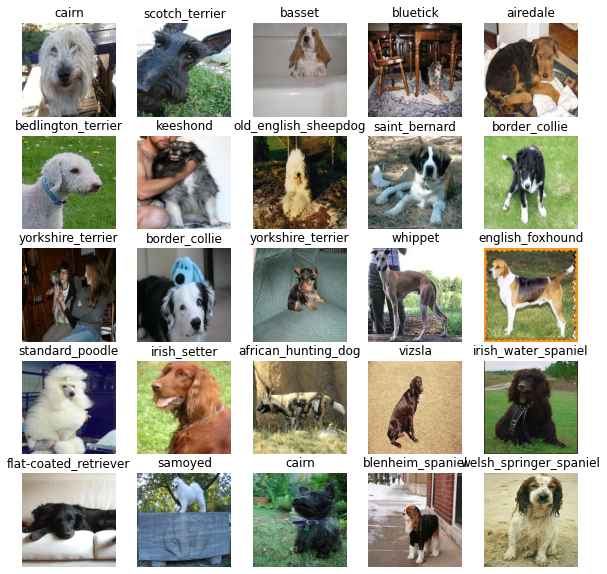

In [ ]:
# Visualize validation data
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width,colour channels

# Setup output shape of our model
OUTPUT_SHAPE =len(unique_breeds)

# Setup model 
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

create a function which:
* Takes the input shape, output shape and the model we've chosen's URL as parameters.
* Defines the layers in a Keras model in a sequential fashion
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells it what kind of input shape it'll be getting).
* Returns the model.


In [ ]:
# Function which builds keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('building model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation='softmax') # layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(), # how wrong its guesses are
      optimizer = tf.keras.optimizers.Adam(), # optimize(reduce) the loss
      metrics = ['accuracy'] # should be high
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### TensorBoard callback( to track our model's progress)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import os
import datetime 

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing tensorboard logs
  logdir = os.path.join('drive/My Drive/dog-vision/logs',
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S')) #year,month,day-hour,min,sec
  return tf.keras.callbacks.TensorBoard(logdir)

### Prevent Overfitting(increasing the ability of model to generalize better)

function used: [`EarlyStopping`](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping)

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

### Training a model(on subset of 1000 images)

`NUM_EPOCHS` defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check we have a GPU running
print('GPU', 'avialable' if tf.config.list_physical_devices('GPU') else 'not available !')

GPU avialable


## Create a function to train the model

The function will:
* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()` (we do this here so it creates a log directory of the current date and time).
* Call the `fit()` function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
* Return the fitted model.

In [ ]:
def train_model():
  """
  Trains a model and returns the trained version of model!
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data & passing it callbacks
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  #return the fitted model
  return model

In [ ]:
# Fit the model to our data
model = train_model()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 194s 6s/step - loss: 4.6890 - accuracy: 0.0975 - val_loss: 3.3887 - val_accuracy: 0.2900
Epoch 2/100
25/25 [==============================] - 3s 117ms/step - loss: 1.6720 - accuracy: 0.6862 - val_loss: 2.1195 - val_accuracy: 0.5500
Epoch 3/100
25/25 [==============================] - 3s 115ms/step - loss: 0.5705 - accuracy: 0.9275 - val_loss: 1.6544 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 3s 115ms/step - loss: 0.2552 - accuracy: 0.9912 - val_loss: 1.4822 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 3s 114ms/step - loss: 0.1500 - accuracy: 0.9950 - val_loss: 1.4096 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 3s 112ms/step - loss: 0.1015 - accuracy: 0.9987 - val_loss: 1.3673 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================]

## Checking the TensorBoard logs

Visualize our model's performance using [`TensorBoard`](https://www.tensorflow.org/tensorboard)

In [ ]:
%tensorboard --logdir drive/My\ Drive/dog-vision/logs

<IPython.core.display.Javascript object>

##  Make predictions on the validation data

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
predictions = model.predict(val_data, verbose=1)

7/7 [==============================] - 1s 81ms/step


In [ ]:
predictions

array([[2.6154350e-03, 5.3868880e-05, 5.0331950e-03, ..., 1.3337546e-04,
        2.5095020e-05, 4.0504672e-03],
       [1.2748672e-03, 2.8340245e-04, 3.0577123e-02, ..., 4.2021016e-05,
        4.2523746e-03, 8.2587998e-05],
       [1.2862751e-06, 9.1057169e-05, 5.9885617e-05, ..., 3.8935621e-05,
        4.9141803e-05, 1.1398603e-04],
       ...,
       [1.2124727e-06, 7.7750374e-06, 5.5022574e-05, ..., 7.8691701e-06,
        8.9240551e-05, 5.5599587e-05],
       [1.5455373e-03, 2.0476634e-04, 8.9496323e-05, ..., 2.3357134e-05,
        1.4139687e-05, 3.7037944e-03],
       [4.2186191e-04, 3.7888267e-06, 3.4864820e-04, ..., 1.3362138e-03,
        1.2183910e-03, 5.4744098e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
predictions[0]

array([2.61543505e-03, 5.38688801e-05, 5.03319502e-03, 1.50875931e-04,
       9.01210005e-05, 2.24408395e-05, 1.81153808e-02, 8.12970102e-04,
       1.36900315e-04, 3.30152165e-04, 2.83303700e-04, 1.23302394e-04,
       3.67403962e-04, 1.60192125e-04, 1.39288534e-03, 5.30301011e-04,
       3.24773049e-04, 2.29545072e-01, 7.22952973e-06, 1.09416484e-04,
       9.97528201e-04, 1.87345999e-04, 2.68182157e-05, 1.32125861e-03,
       7.39182869e-05, 9.37402001e-05, 1.44324243e-01, 1.32929694e-04,
       4.39239026e-04, 6.95155002e-04, 6.25127723e-05, 1.66882004e-03,
       3.69219400e-04, 1.32311165e-04, 8.47911811e-04, 3.95529605e-02,
       4.88041915e-05, 3.37327365e-03, 5.09856211e-04, 1.74509390e-04,
       3.09637253e-04, 7.00521996e-05, 2.99051753e-04, 4.23014106e-04,
       4.61999152e-05, 1.46602106e-04, 1.19755379e-04, 1.85244251e-04,
       2.71570316e-04, 1.74014305e-04, 1.67416569e-04, 3.18063074e-04,
       4.59543488e-04, 4.96567300e-05, 1.23249146e-03, 8.15989624e-05,
      

In [ ]:
# Check first prediction
index = 81
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

Max value (probability of prediction): 0.22431421279907227
Sum: 1.0
Max index: 29
Predicted label: chihuahua


In [ ]:
unique_breeds[37]

'dingo'

In [ ]:
# turn prediction probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns the array of prediction probabilities into label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
get_pred_label(predictions[81])

'chihuahua'

### Unbatch the data

In [ ]:
# Create a function to unbatch the data
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels  

In [ ]:
# Unbatch valid data
val_images, val_labels = unbatchify(val_data)
val_images[81], val_labels[81]

(array([[[0.53783923, 0.45836595, 0.3068343 ],
         [0.6215927 , 0.5291915 , 0.3462944 ],
         [0.49747768, 0.37204874, 0.16942032],
         ...,
         [0.9964487 , 0.98156726, 0.98259443],
         [0.982528  , 0.99667376, 0.96149755],
         [0.9700722 , 0.9976801 , 0.91755074]],
 
        [[0.9370432 , 0.84034467, 0.69213176],
         [0.60235995, 0.50495464, 0.2862638 ],
         [0.47836804, 0.36053362, 0.07144748],
         ...,
         [0.99633765, 0.9947586 , 0.9247661 ],
         [0.9881982 , 0.99261427, 0.9742606 ],
         [0.9907286 , 0.99361885, 0.98447204]],
 
        [[0.7424257 , 0.6257415 , 0.38006455],
         [0.6829543 , 0.5777236 , 0.27114627],
         [0.58294815, 0.4714928 , 0.11638377],
         ...,
         [0.9266495 , 0.9285259 , 0.8467509 ],
         [0.9660978 , 0.9566142 , 0.9391774 ],
         [0.98249197, 0.970306  , 0.9629354 ]],
 
        ...,
 
        [[0.30568364, 0.2360058 , 0.21065564],
         [0.28961092, 0.24349749, 0.16923

### Visually compare the predicted & actual label

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% (truth label: {})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

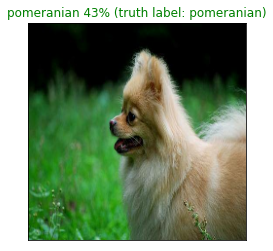

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=178)

### Function to plot the top 10 predictions
The function will:
* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using `get_pred_label()`.
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # get the predicted label
  pred_label = get_pred_label(labels)

  # Find find the top 10 prediction confidence indexes 
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_indexes)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks( np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
  else:
    pass

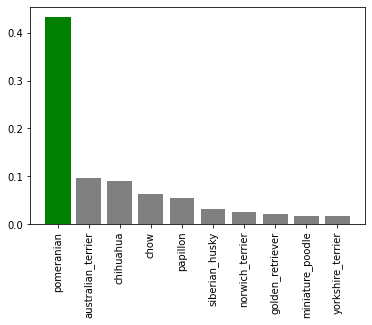

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=178)

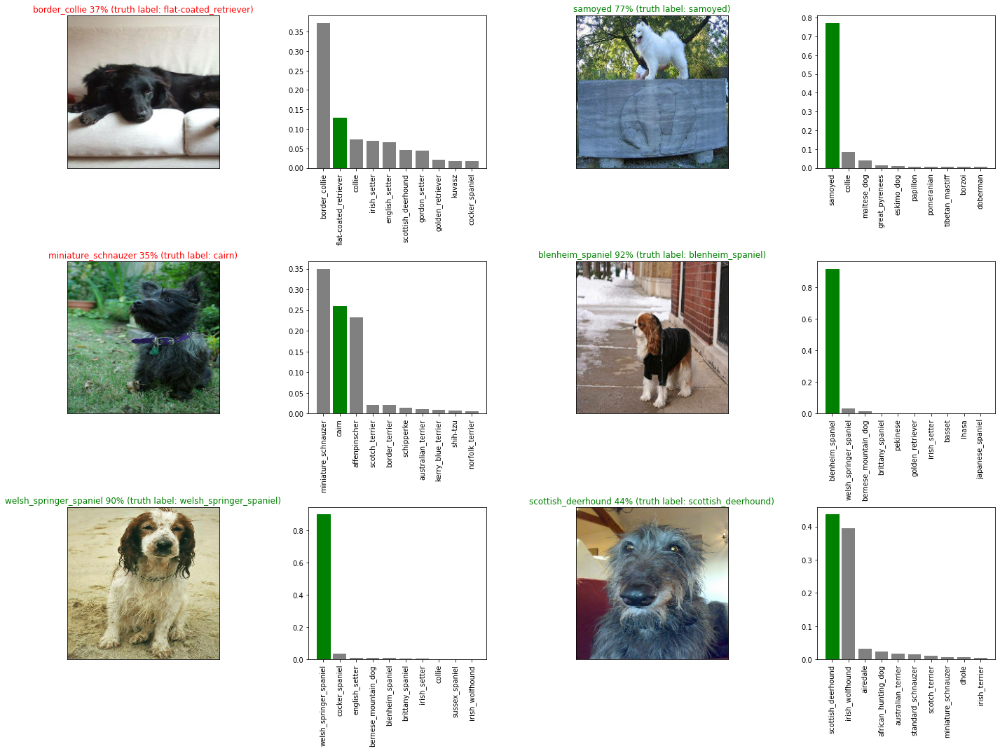

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
# Function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/dog-vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" +suffix + ".h5" # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  load a saved model from a specific path.
  """
  print(f'Loading saved model from {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/dog-vision/models/20210821-05161629522974-1000-images-mobilenetv2-Adam.h5...


In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/My Drive/dog-vision/models/20200824-06271598250439-1000-images-mobilenetv2-Adam.h5')

In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 88ms/step - loss: 1.2830 - accuracy: 0.6750


[1.2829792499542236, 0.675000011920929]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 79ms/step - loss: 1.3547 - accuracy: 0.6250


[1.354729413986206, 0.625]

# Training a model on full dataset

In [ ]:
# Creating data with batches
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full data
full_model = create_model()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# Stop from over-fitting
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

In [ ]:
# Fit a model with full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1630s 5s/step - loss: 1.3555 - accuracy: 0.6694
Epoch 2/100
320/320 [==============================] - 29s 91ms/step - loss: 0.3999 - accuracy: 0.8834
Epoch 3/100
320/320 [==============================] - 29s 90ms/step - loss: 0.2367 - accuracy: 0.9340
Epoch 4/100
320/320 [==============================] - 29s 90ms/step - loss: 0.1537 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 29s 90ms/step - loss: 0.1033 - accuracy: 0.9799
Epoch 6/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0789 - accuracy: 0.9859
Epoch 7/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0583 - accuracy: 0.9927
Epoch 8/100
320/320 [==============================] - 29s 89ms/step - loss: 0.0452 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0377 - accuracy: 0.9954
Epoch 10/100
320/320 [==============================] - 29s 89ms/step - l

In [ ]:
save_model(full_model, suffix="10222-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/dog-vision/models/20210821-05541629525281-10222-images-mobilenetv2-Adam.h5...


In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/dog-vision/models/20200824-09191598260759-10222-images-mobilenetv2-Adam.h5')

Loading saved model from drive/My Drive/dog-vision/models/20200824-09191598260759-10222-images-mobilenetv2-Adam.h5


In [ ]:
len(X)

10222

# Make Predictions on test data

In [ ]:
# Load test image filenames
test_path = 'drive/My Drive/dog-vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [ ]:
test_filenames[:10]

['drive/My Drive/dog-vision/test/e3ff13afe2400a95e3ab76759d94fbc4.jpg',
 'drive/My Drive/dog-vision/test/e4ba350279796ff15c3a634037a6f88e.jpg',
 'drive/My Drive/dog-vision/test/e293d06016cac647cd289e2008a4623a.jpg',
 'drive/My Drive/dog-vision/test/e68da487dabcd11874830a177e8b6218.jpg',
 'drive/My Drive/dog-vision/test/e1e7949f64ff3283a5dafa9d39199193.jpg',
 'drive/My Drive/dog-vision/test/dfac7db18136057f5d1730c0055f875c.jpg',
 'drive/My Drive/dog-vision/test/e427b9e1ab1b7f09cfb02ac073f56f2d.jpg',
 'drive/My Drive/dog-vision/test/e176e183224bc71ce64edb44cb94688e.jpg',
 'drive/My Drive/dog-vision/test/ddfe1bb4884e83421872030ac62835f1.jpg',
 'drive/My Drive/dog-vision/test/e67cd079a0f9c15ebee3c41743906c73.jpg']

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
test_predictions = loaded_full_model.predict(test_data,
                                              verbose=1)

324/324 [==============================] - 1802s 6s/step


In [ ]:
# Save predictions(Numpy array) to csv file
np.savetxt("drive/My Drive/dog-vision/preds_array.csv", test_predictions, delimiter=',')

In [ ]:
# load predictions from csv file to Numpy array 
test_predictions = np.loadtxt('drive/My Drive/dog-vision/preds_array.csv', delimiter=',')

In [ ]:
test_predictions[:10]

array([[2.74039036e-09, 8.08860605e-08, 7.01675957e-12, ...,
        1.00922361e-10, 6.61274438e-11, 3.41271044e-12],
       [1.22652000e-06, 3.35770324e-06, 6.88765795e-05, ...,
        1.85414058e-06, 3.03274007e-12, 3.76189746e-10],
       [5.19019716e-09, 3.20366822e-09, 1.43810450e-10, ...,
        8.27818554e-13, 1.45124657e-12, 6.36632729e-04],
       ...,
       [1.35325649e-07, 1.66525305e-09, 1.32542133e-09, ...,
        1.46368730e-08, 2.39310283e-09, 3.06779202e-09],
       [3.73569814e-10, 2.58685191e-07, 4.74349138e-09, ...,
        6.12713507e-07, 5.40558154e-10, 8.21296631e-09],
       [3.01406794e-12, 3.40417960e-09, 1.83958529e-10, ...,
        2.53418397e-10, 6.49776484e-06, 2.26240471e-10]])

In [ ]:
test_predictions.shape

(10357, 120)

# Making Custom Predictions

In [ ]:
# Get custom image filepaths
custom_path = "/content/drive/My Drive/dog-vision/custom images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [ ]:
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['malamute', 'labrador_retriever']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

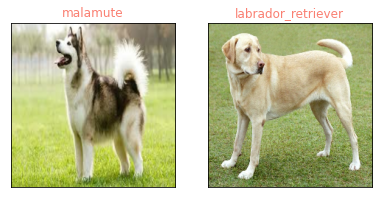

In [ ]:
import matplotlib.pyplot as plt

# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i], color='salmon')
  plt.imshow(image)